In [1]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import pickle
import os
import time
import pandas as pd
import sklearn

In [2]:
def loadmodel(name='SVC'):
    with open(f'./model/{name}.pickle', 'rb') as f:
        model = pickle.load(f)
    return model

In [3]:
def removeGreen(img, model, bg):
    if img.shape != bg.shape:
        bg = cv.resize(bg, (img.shape[1], img.shape[0]),fx=0,fy=0, interpolation = cv.INTER_CUBIC)

    mask = model.predict(img.reshape(-1, 3))
    mask = mask.reshape(img.shape[0], img.shape[1])
    img[mask == '1'] = bg[mask == '1']

    return img

In [4]:
def show_image(img, bg, newimg, n=3):
    f = plt.figure(figsize=(20,20))
   
    f.add_subplot(1, 3, 1)
    # img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title('Foreground')

    f.add_subplot(1, 3, 2)
    # bg = cv.cvtColor(bg, cv.COLOR_BGR2RGB)
    plt.imshow(bg)
    plt.title('Background')

    f.add_subplot(1, 3, 3)
    # newimg = cv.cvtColor(newimg, cv.COLOR_BGR2RGB)
    plt.imshow(newimg)
    plt.title('Result')

    plt.show(block=True)
    

In [5]:
def videoProcesing(model, bg, name='vid-1',model_name='') -> None:
    cap = cv.VideoCapture(f'./video/{name}.mp4')
    fourcc = cv.VideoWriter_fourcc('h', '2', '6', '4')
    # out_name = name.split('/')[1].split('.')[0]
    out = cv.VideoWriter(
        f'output_vid/{model_name}_{name}.mp4', fourcc, 30, (640, 480))
    while cap.isOpened():
        ret, frame = cap.read()
        if ret:
            # frame = cv.GaussianBlur(frame, (5, 5), 0)
            resized_frame = cv.resize(
                frame, (640, 480), fx=0, fy=0, interpolation=cv.INTER_CUBIC)
            processed_frame = removeGreen(resized_frame, model, bg)
            out.write(processed_frame)
            # cv.imshow(f'{model_name}', processed_frame)
            if cv.waitKey(1) & 0xFF == ord('q'):
                break
        else:
            break
    cap.release()
    out.release()
    cv.destroyAllWindows()

In [6]:
def save_image(img, name):
    img = cv.cvtColor(img, cv.COLOR_RGB2BGR)
    cv.imwrite(f'./output_pic/{name}.jpg', img)

## SGDClassifier

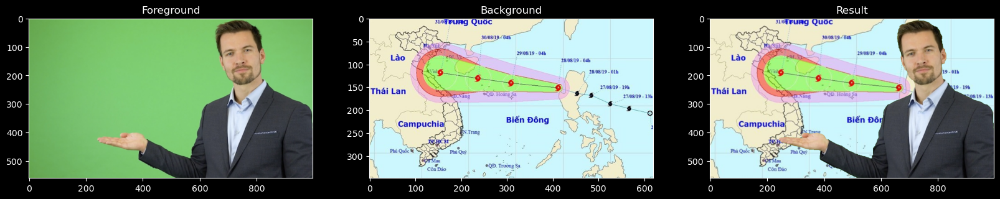

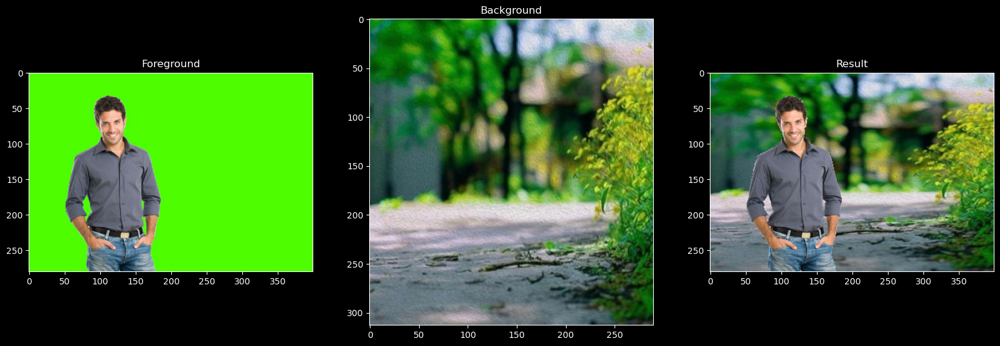

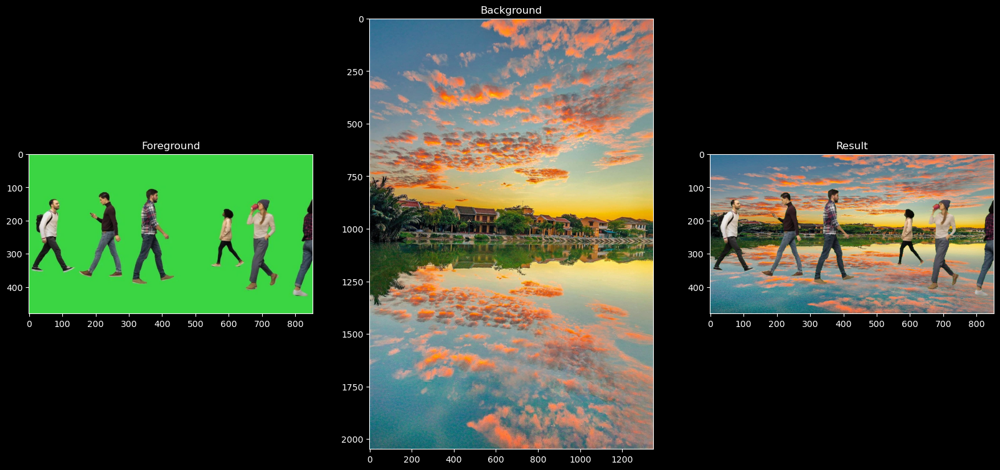

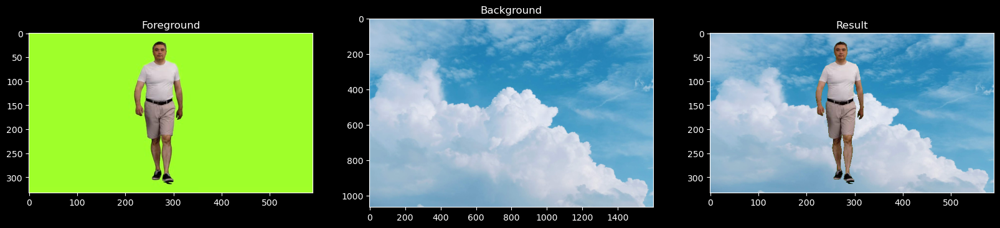

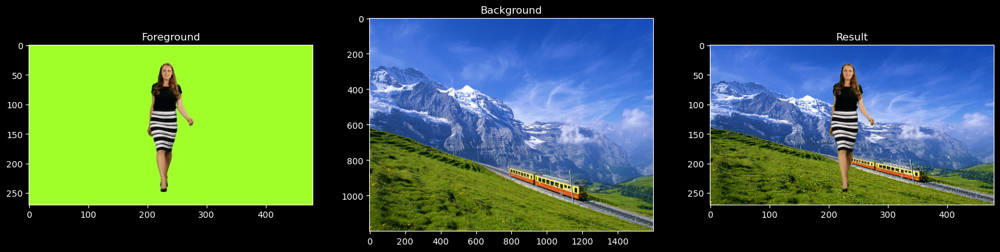

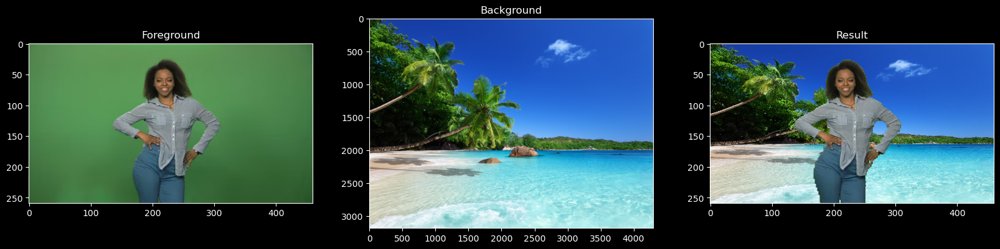

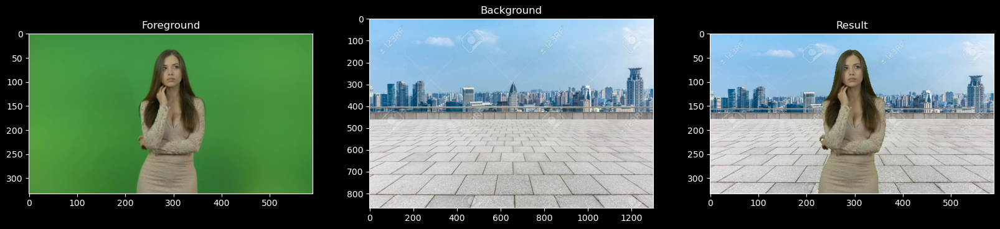

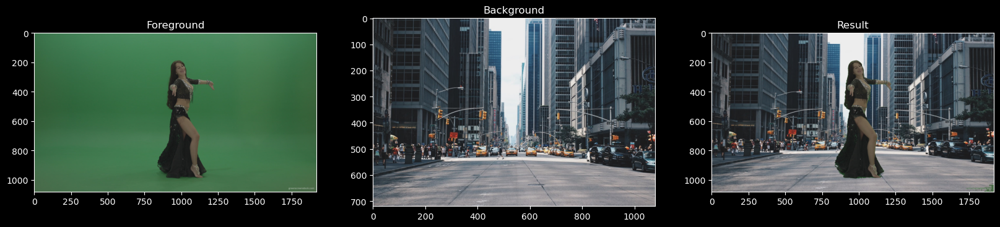

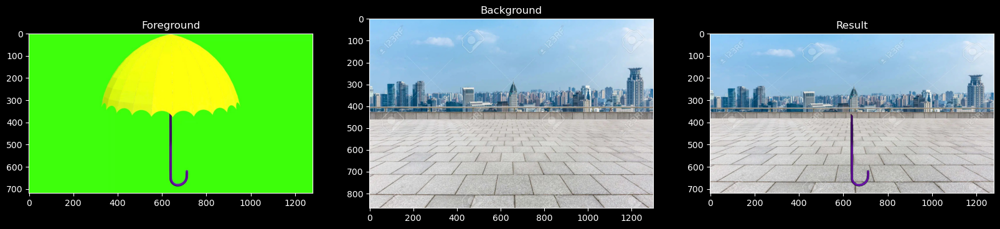

In [16]:
path_fg_folder = './foreground/'
path_bg_folder = './background/'
model = loadmodel('SGDClassifier')
for i in range(1,10):
    fg_path = path_fg_folder + 'fg-' + str(i) + '.jpg'
    bg_path = path_bg_folder + 'bg-' + str(i) + '.jpg'
    fg = cv.imread(fg_path,1)
    bg = cv.imread(bg_path,1)
    newImg = removeGreen(fg.copy(),model,bg)
    fg = cv.cvtColor(fg,cv.COLOR_BGR2RGB)
    bg = cv.cvtColor(bg,cv.COLOR_BGR2RGB)
    newImg= cv.cvtColor(newImg,cv.COLOR_BGR2RGB)
    save_image(newImg,f'SGDClassifier_out{i}')
    show_image(fg,bg,newImg)


In [46]:
path_vid_folder = './video/'
path_bg_folder = './background/'
model = loadmodel('SGDClassifier')
for i in range(1,8):
    bg_path = path_bg_folder + 'bg-' + str(i) + '.jpg'
    bg = cv.imread(bg_path,1)
    videoProcesing(model,bg,f'vid-{i}','SGDClassifier')

## Logistic Regression

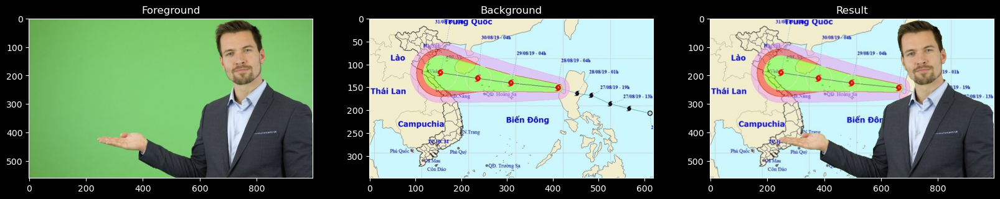

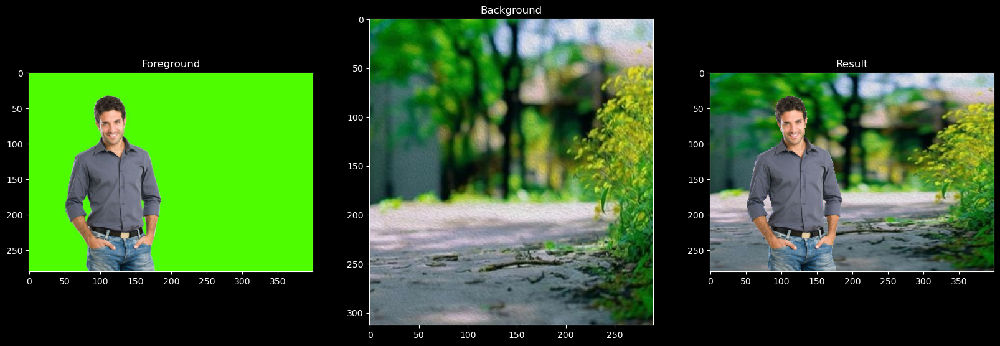

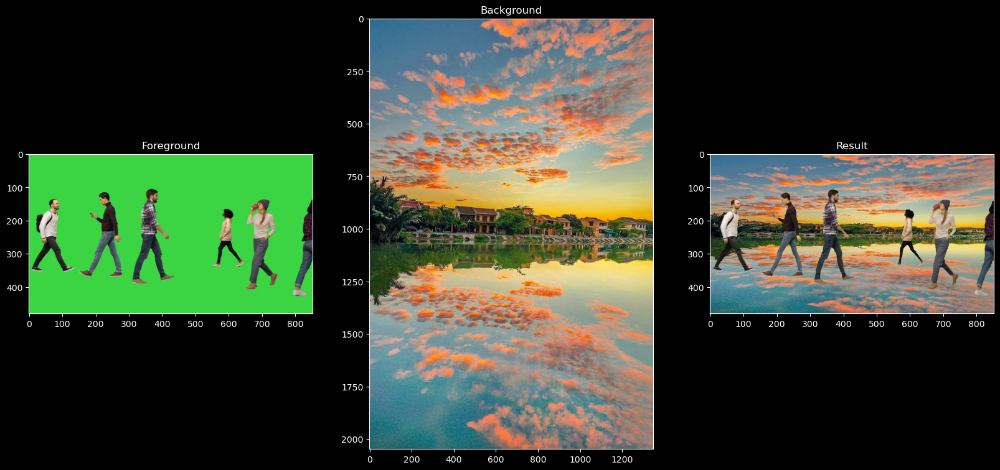

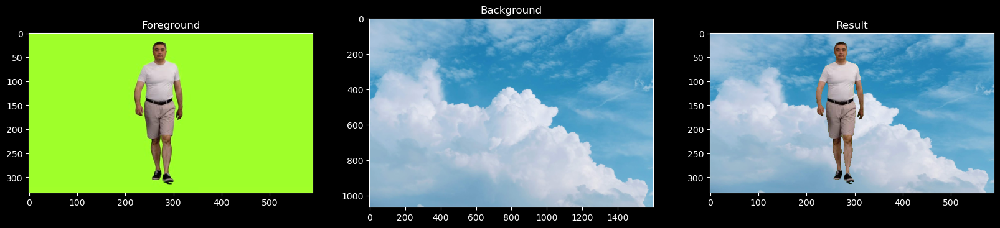

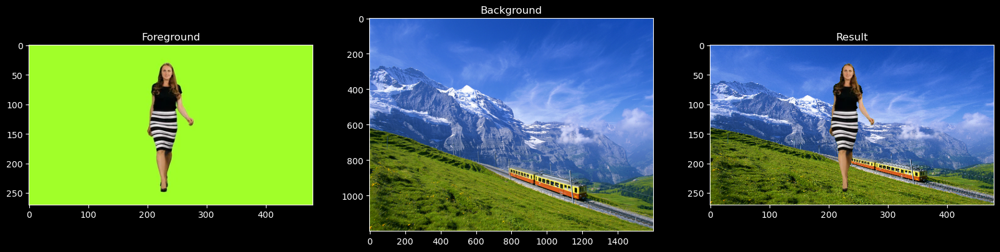

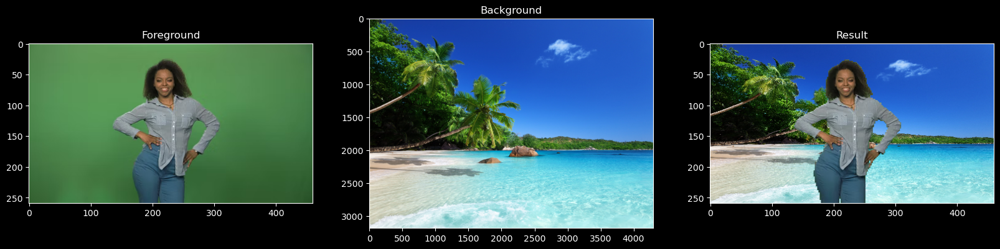

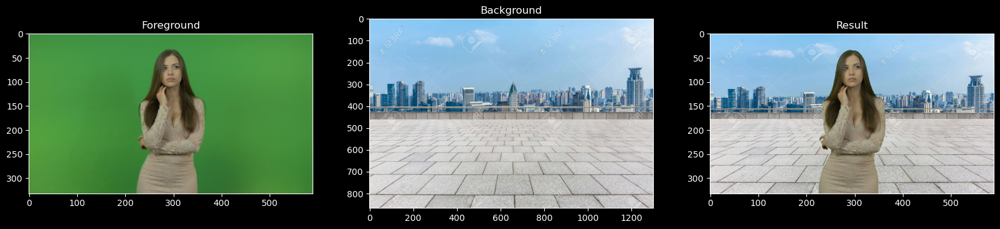

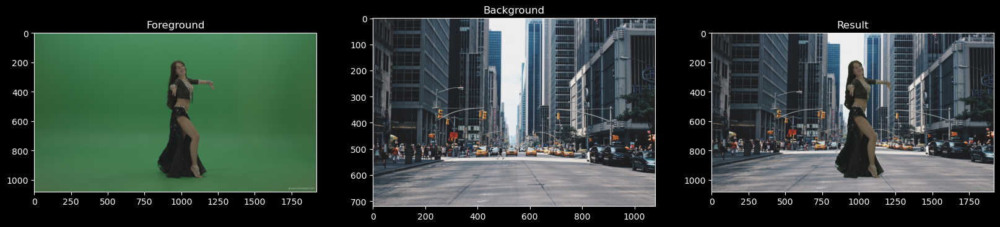

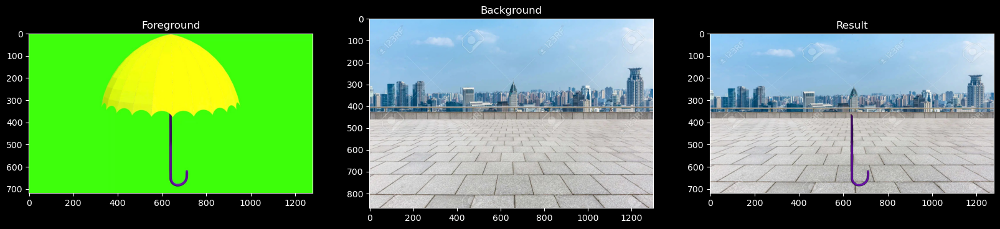

In [17]:
path_fg_folder = './foreground/'
path_bg_folder = './background/'
model = loadmodel('LogisticRegression')
for i in range(1,10):
    fg_path = path_fg_folder + 'fg-' + str(i) + '.jpg'
    bg_path = path_bg_folder + 'bg-' + str(i) + '.jpg'
    fg = cv.imread(fg_path,1)
    bg = cv.imread(bg_path,1)
    newImg = removeGreen(fg.copy(),model,bg)
    fg = cv.cvtColor(fg,cv.COLOR_BGR2RGB)
    bg = cv.cvtColor(bg,cv.COLOR_BGR2RGB)
    newImg= cv.cvtColor(newImg,cv.COLOR_BGR2RGB)
    save_image(newImg,f'LogisticRegression_out{i}')
    show_image(fg,bg,newImg)


In [48]:
path_vid_folder = './video/'
path_bg_folder = './background/'
model = loadmodel('LogisticRegression')
for i in range(1,8):
    bg_path = path_bg_folder + 'bg-' + str(i) + '.jpg'
    bg = cv.imread(bg_path,1)
    videoProcesing(model,bg,f'vid-{i}','LogisticRegression')

## Decision Tree Classifier

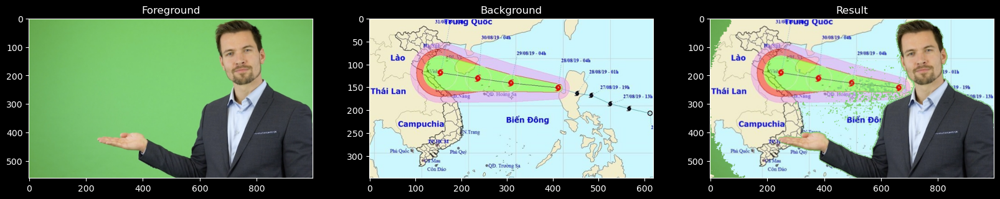

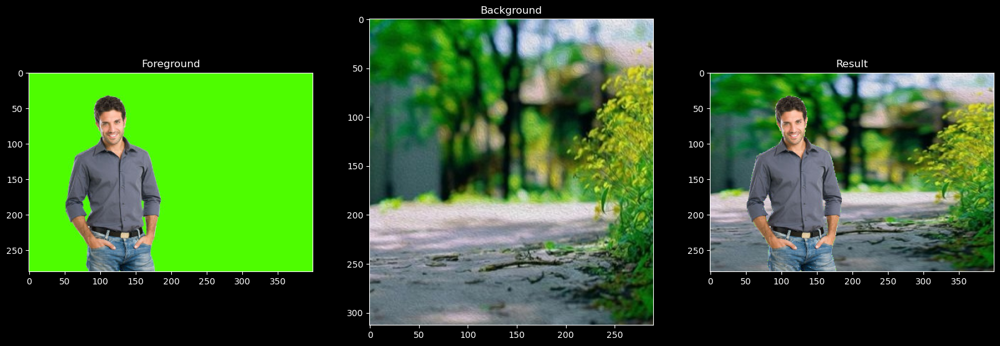

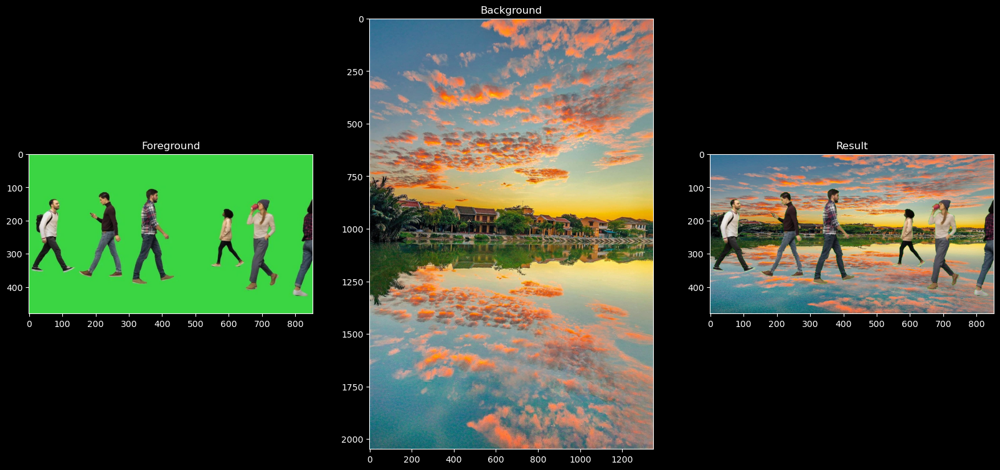

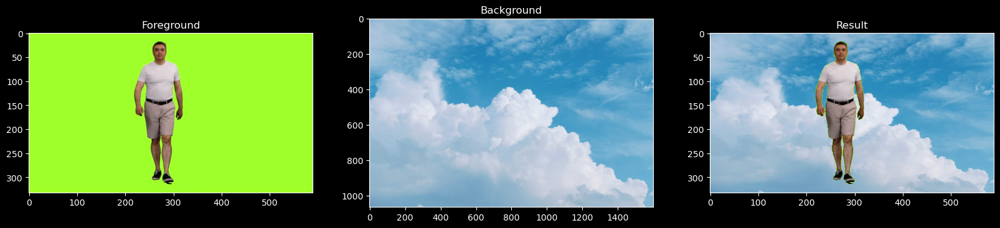

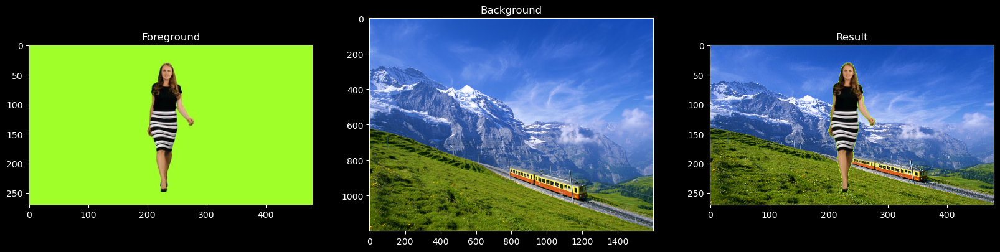

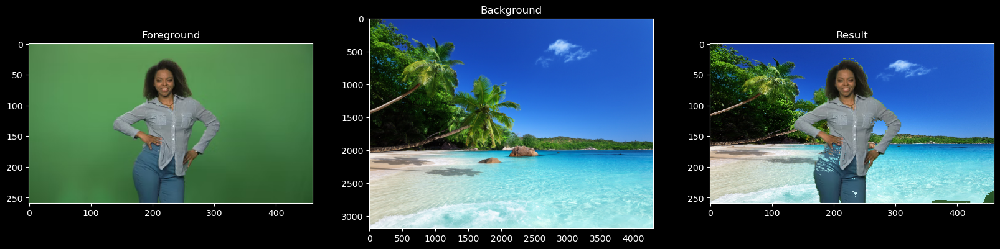

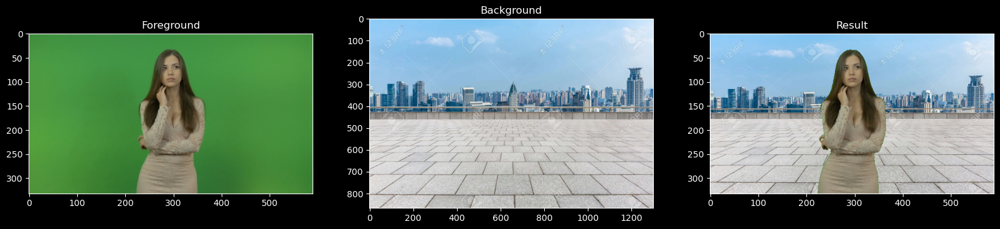

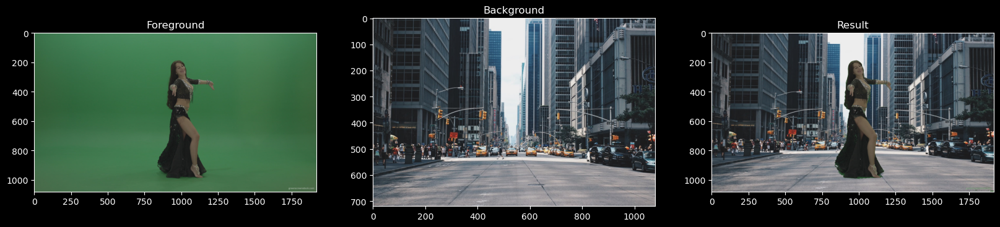

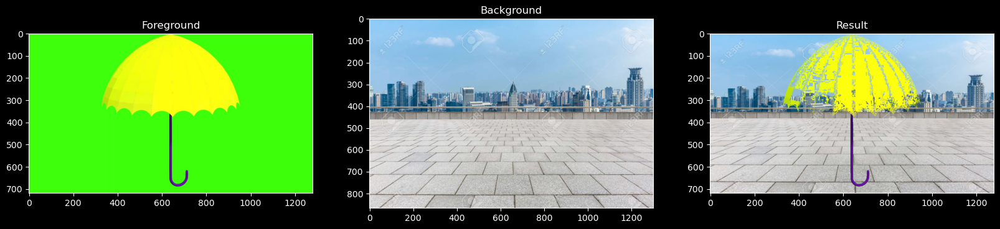

In [18]:
path_fg_folder = './foreground/'
path_bg_folder = './background/'
model = loadmodel('DecisionTreeClassifier')
for i in range(1,10):
    fg_path = path_fg_folder + 'fg-' + str(i) + '.jpg'
    bg_path = path_bg_folder + 'bg-' + str(i) + '.jpg'
    fg = cv.imread(fg_path,1)
    bg = cv.imread(bg_path,1)
    newImg = removeGreen(fg.copy(),model,bg)
    fg = cv.cvtColor(fg,cv.COLOR_BGR2RGB)
    bg = cv.cvtColor(bg,cv.COLOR_BGR2RGB)
    newImg= cv.cvtColor(newImg,cv.COLOR_BGR2RGB)
    save_image(newImg,f'DecisionTreeClassifier_out{i}')
    show_image(fg,bg,newImg)


In [50]:
path_vid_folder = './video/'
path_bg_folder = './background/'
model = loadmodel('DecisionTreeClassifier')
for i in range(1,8):
    bg_path = path_bg_folder + 'bg-' + str(i) + '.jpg'
    bg = cv.imread(bg_path,1)
    videoProcesing(model,bg,f'vid-{i}','DecisionTreeClassifier')

In [13]:
def videoProcesing2(model, name_bg='vid-8', name_fg='vid-1',model_name='') -> None:
    cap_fg = cv.VideoCapture(f'./video/{name_fg}.mp4')
    cap_bg = cv.VideoCapture(f'./video/{name_bg}.mp4')
    fourcc = cv.VideoWriter_fourcc('h', '2', '6', '4')
    # out_name = name.split('/')[1].split('.')[0]
    out = cv.VideoWriter(
        f'output_vid/{model_name}_VideoVideo.mp4', fourcc, 30, (640, 480))
    while cap_fg.isOpened() and cap_bg.isOpened():
        ret1, frame1 = cap_fg.read()
        ret2, frame2 = cap_bg.read()
        if ret1 and ret2:
            # frame = cv.GaussianBlur(frame, (5, 5), 0)
            resized_frame1 = cv.resize(
                frame1, (640, 480), fx=0, fy=0, interpolation=cv.INTER_CUBIC)
            resized_frame2 = cv.resize(
                frame2, (640, 480), fx=0, fy=0, interpolation=cv.INTER_CUBIC)
            
            processed_frame = removeGreen(resized_frame1, model, resized_frame2)
            out.write(processed_frame)
            cv.imshow(f'{model_name}', processed_frame)
            if cv.waitKey(1) & 0xFF == ord('q'):
                break
        else:
            break
    cap_fg.release()
    cap_bg.release()
    out.release()
    cv.destroyAllWindows()

In [15]:
model = loadmodel('LogisticRegression')
videoProcesing2(model, 'vid-8', 'vid-3', 'LogisticRegression')
